Using the boston dataset to try out simple linear regression using sklearn.

In [1]:
import pandas as pd
df = pd.read_csv("../Datasets/BostonHousing.csv")
df.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS','NOX', 'RM', 'AGE', 'DIS', 'RAD','TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
5,0.02985,0.0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21,28.7
6,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,395.60,12.43,22.9
7,0.14455,12.5,7.87,0,0.524,6.172,96.1,5.9505,5,311,15.2,396.90,19.15,27.1
8,0.21124,12.5,7.87,0,0.524,5.631,100.0,6.0821,5,311,15.2,386.63,29.93,16.5
9,0.17004,12.5,7.87,0,0.524,6.004,85.9,6.5921,5,311,15.2,386.71,17.10,18.9


In [4]:
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid', context='notebook')
cols = ['LSTAT', 'INDUS', 'NOX', 'RM', 'MEDV']
sns.pairplot(df[cols], height=3, palette="husl")
plt.show()

<Figure size 1500x1500 with 30 Axes>

From the above pairplots one can notice that the graph of RM vs MEDV bears a somewhat approximate linear relationship. 

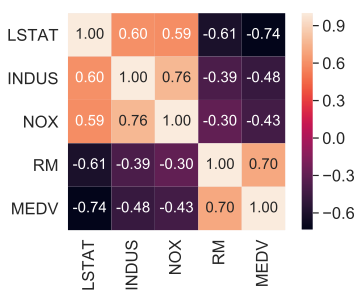

In [5]:
import numpy as np
%config InlineBackend.figure_format = 'svg'
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.5)
hm = sns.heatmap(cm,cbar=True,annot=True,square=True,fmt='.2f',annot_kws={'size': 15},yticklabels=cols,xticklabels=cols)
plt.show()

From the above correlation matrix, it is clear that MEDV and RM have a strong correlation of 0.70. 

In [2]:
from sklearn.model_selection import train_test_split
#X = df.iloc[:,:-1].values
X = df[['RM']].values
y = df['MEDV'].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

In [3]:
def lin_regplot(X, y, model):
    plt.scatter(X, y, c='yellow')
    plt.plot(X, model.predict(X), color='red', linewidth=2)    
    return
#Function to plot a scatter plot of input variables and target, along with model's prediction line of best fit.

In [4]:
from sklearn.linear_model import LinearRegression
slr = LinearRegression()
slr.fit(X_train, y_train)
y_pred = slr.predict(X_test)
print('Slope: %.3f' % slr.coef_[0])
print('Intercept: %.3f' % slr.intercept_)

Slope: 9.311
Intercept: -35.994


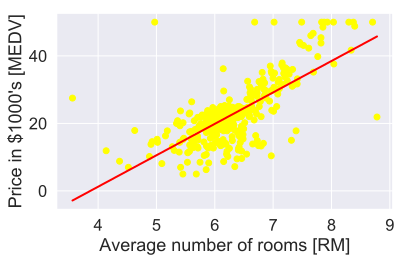

In [9]:
lin_regplot(X_train, y_train, slr)
plt.xlabel('Average number of rooms [RM]')
plt.ylabel('Price in $1000\'s [MEDV]')
plt.tight_layout()
plt.show()

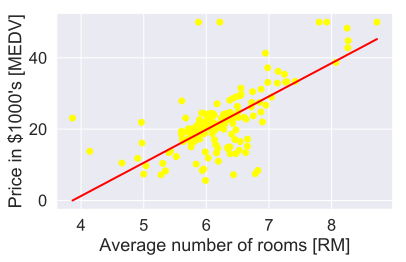

In [10]:
lin_regplot(X_test, y_test, slr)
plt.xlabel('Average number of rooms [RM]')
plt.ylabel('Price in $1000\'s [MEDV]')
plt.tight_layout()
plt.show()

Residual plots are a commonly used graphical analysis for diagnosing
regression models to detect nonlinearity and outliers, and to check if the errors
are randomly distributed.

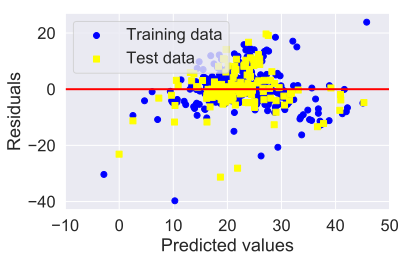

In [11]:
y_train_pred = slr.predict(X_train)
y_test_pred = slr.predict(X_test)
plt.scatter(y_train_pred,  y_train_pred - y_train,
            c='blue', marker='o', label='Training data')
plt.scatter(y_test_pred,  y_test_pred - y_test,
            c='yellow', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=-10, xmax=50, lw=2, color='red')
plt.xlim([-10, 50])
plt.tight_layout()
plt.show()

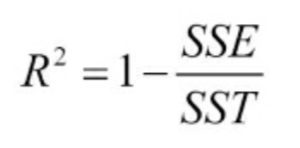

SSE = Sum of squares error
SST = Total sum of squares

Known as the coefficient of determination - standardized version of MSE.

In [12]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 42.158, test: 47.033
R^2 train: 0.503, test: 0.435


Multiple Linear Regresssion, Taking in all features into account to predict MEDV

In [13]:
from sklearn.model_selection import train_test_split
X = df.iloc[:,:-1].values
y = df['MEDV'].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

In [14]:
mlr = LinearRegression()
mlr.fit(X_train, y_train)
y_pred = mlr.predict(X_test)
print('Slope: %.3f' % mlr.coef_[0])
print('Intercept: %.3f' % mlr.intercept_)

Slope: -0.121
Intercept: 37.937


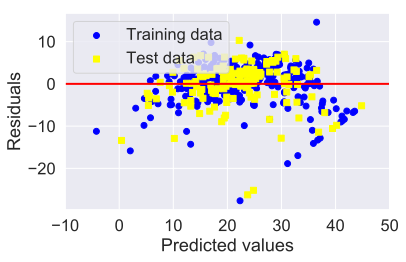

In [15]:
y_train_pred = mlr.predict(X_train)
y_test_pred = mlr.predict(X_test)
plt.scatter(y_train_pred,  y_train_pred - y_train,
            c='blue', marker='o', label='Training data')
plt.scatter(y_test_pred,  y_test_pred - y_test,
            c='yellow', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=-10, xmax=50, lw=2, color='red')
plt.xlim([-10, 50])
plt.tight_layout()
plt.show()

In [16]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 19.958, test: 27.196
R^2 train: 0.765, test: 0.673


As we can see, taking more features into account gives us a better score. 

In [17]:
ccpp = pd.read_csv("../Datasets/CCPP.csv")
ccpp

,AT,V,AP,RH,PE
0,14.96,41.76,1024.07,73.17,463.26
1,25.18,62.96,1020.04,59.08,444.37
2,5.11,39.40,1012.16,92.14,488.56
3,20.86,57.32,1010.24,76.64,446.48
4,10.82,37.50,1009.23,96.62,473.90
5,26.27,59.44,1012.23,58.77,443.67
6,15.89,43.96,1014.02,75.24,467.35
7,9.48,44.71,1019.12,66.43,478.42
8,14.64,45.00,1021.78,41.25,475.98
9,11.74,43.56,1015.14,70.72,477.50


In [18]:
sns.pairplot(ccpp, vars=['AT','PE','V'])

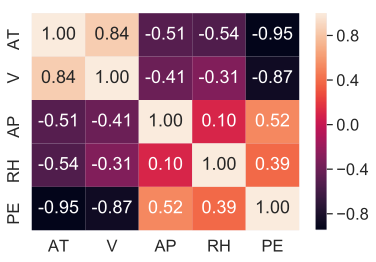

In [19]:
heat = sns.heatmap(ccpp.corr(),annot=True, fmt='.2f')

PE vs AT has the highest correlation of -0.95, which we will use for linear regression.

In [20]:
from sklearn.model_selection import train_test_split
#X = ccpp.iloc[:,:-2].values
X = ccpp[['AT']].values
y = ccpp['PE'].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

In [21]:
from sklearn.linear_model import LinearRegression
slr = LinearRegression()
slr.fit(X_train, y_train)
y_pred = slr.predict(X_test)
print('Slope: %.3f' % slr.coef_[0])
print('Intercept: %.3f' % slr.intercept_)

Slope: -2.173
Intercept: 497.040


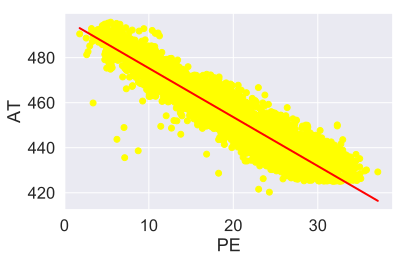

In [22]:
lin_regplot(X_train, y_train, slr)
plt.xlabel('PE')
plt.ylabel('AT')
plt.tight_layout()
plt.show()

In [23]:
y_train_pred = slr.predict(X_train)
y_test_pred = slr.predict(X_test)

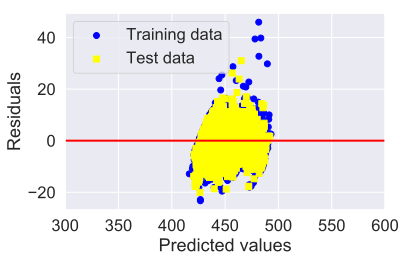

In [24]:
plt.scatter(y_train_pred,  y_train_pred - y_train,
            c='blue', marker='o', label='Training data')
plt.scatter(y_test_pred,  y_test_pred - y_test,
            c='yellow', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=300, xmax=600, lw=2, color='red')
plt.xlim([300, 600])
plt.tight_layout()
plt.show()

In [25]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 29.737, test: 28.723
R^2 train: 0.898, test: 0.902


Multiple Linear Regression

In [26]:
from sklearn.model_selection import train_test_split
X = ccpp.iloc[:,:-1].values
#X = ccpp[['AT']].values
y = ccpp['PE'].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=0)

In [27]:
mlr = LinearRegression()
mlr.fit(X_train, y_train)
y_pred = mlr.predict(X_test)
print('Slope: %.3f' % mlr.coef_[0])
print('Intercept: %.3f' % mlr.intercept_)

Slope: -1.964
Intercept: 448.561


In [28]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
y_train_pred = mlr.predict(X_train)
y_test_pred = mlr.predict(X_test)
print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 20.942, test: 20.368
R^2 train: 0.928, test: 0.930


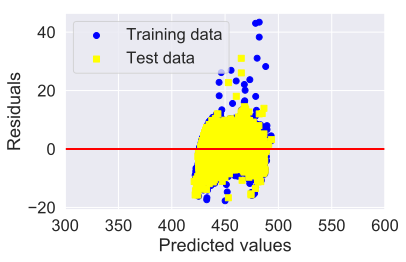

In [29]:
y_train_pred = mlr.predict(X_train)
y_test_pred = mlr.predict(X_test)
plt.scatter(y_train_pred,  y_train_pred - y_train,
            c='blue', marker='o', label='Training data')
plt.scatter(y_test_pred,  y_test_pred - y_test,
            c='yellow', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=300, xmax=600, lw=2, color='red')
plt.xlim([300, 600])
plt.tight_layout()
plt.show()

Polynomial Regression

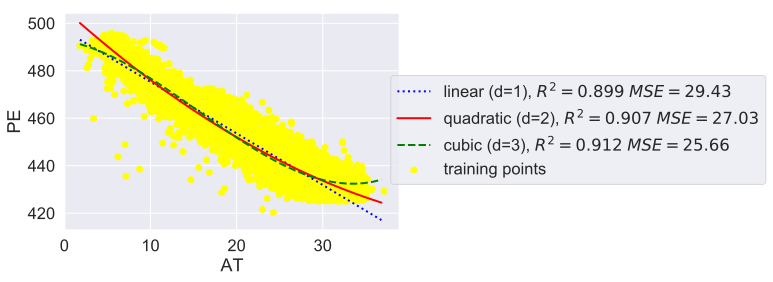

In [40]:
from sklearn.preprocessing import PolynomialFeatures

X = ccpp[['AT']].values
y = ccpp['PE'].values

regr = LinearRegression()

# create quadratic features
quadratic = PolynomialFeatures(degree=2)
cubic = PolynomialFeatures(degree=3)
X_quad = quadratic.fit_transform(X)
X_cubic = cubic.fit_transform(X)

# fit features
X_fit = np.arange(X.min(), X.max(), 1)[:, np.newaxis]

regr = regr.fit(X, y)
y_lin_fit = regr.predict(X_fit)
linear_r2 = r2_score(y, regr.predict(X))
linear_mse = mean_squared_error(y, regr.predict(X))

regr = regr.fit(X_quad, y)
y_quad_fit = regr.predict(quadratic.fit_transform(X_fit))
quadratic_r2 = r2_score(y, regr.predict(X_quad))
quadratic_mse = mean_squared_error(y, regr.predict(X_quad))

regr = regr.fit(X_cubic, y)
y_cubic_fit = regr.predict(cubic.fit_transform(X_fit))
cubic_r2 = r2_score(y, regr.predict(X_cubic))
cubic_mse = mean_squared_error(y, regr.predict(X_cubic))

# plot results
plt.scatter(X, y, label='training points', color='yellow')

plt.plot(X_fit, y_lin_fit, 
         label='linear (d=1), $R^2=%.3f$ $MSE=%.2f$' % (linear_r2,linear_mse), 
         color='blue', 
         lw=2, 
         linestyle=':')

plt.plot(X_fit, y_quad_fit, 
         label='quadratic (d=2), $R^2=%.3f$ $MSE=%.2f$' % (quadratic_r2,quadratic_mse),
         color='red', 
         lw=2,
         linestyle='-')

plt.plot(X_fit, y_cubic_fit, 
         label='cubic (d=3), $R^2=%.3f$ $MSE=%.2f$' % (cubic_r2,cubic_mse),
         color='green', 
         lw=2, 
         linestyle='--')

plt.xlabel('AT')
plt.ylabel('PE')
#plt.legend(loc='upper right')
plt.legend(loc='best', bbox_to_anchor=(0.95, 0.75))
plt.show()

Decision Tree Regression

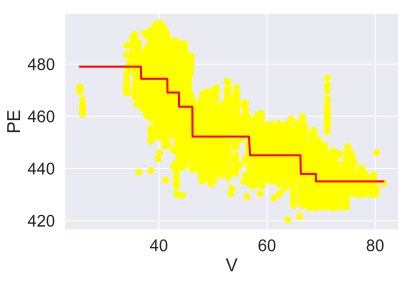

MSE: 56.785
R^2: 0.805


In [34]:
from sklearn.tree import DecisionTreeRegressor

X = ccpp[['V']].values
y = ccpp['PE'].values

tree = DecisionTreeRegressor(max_depth=3)
tree.fit(X, y)
y_train_pred = tree.predict(X)
sort_idx = X.flatten().argsort()

lin_regplot(X[sort_idx], y[sort_idx], tree)
plt.xlabel('V')
plt.ylabel('PE')
plt.show()

print('MSE: %.3f' % (mean_squared_error(y, y_train_pred)))
print('R^2: %.3f' % (r2_score(y, y_train_pred)))

MSE train: 57.221, test: 56.514
R^2 train: 0.803, test: 0.806


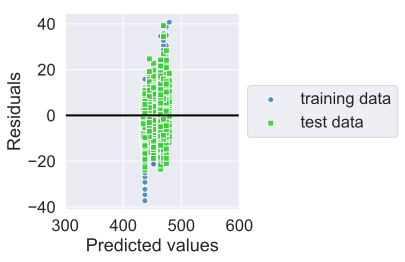

In [38]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=1)
tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

plt.scatter(y_train_pred,  
            y_train_pred - y_train, 
            c='steelblue',
            edgecolor='white',
            marker='o', 
            s=35,
            alpha=0.9,
            label='training data')
plt.scatter(y_test_pred,  
            y_test_pred - y_test, 
            c='limegreen',
            edgecolor='white',
            marker='s', 
            s=35,
            alpha=0.9,
            label='test data')

plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.hlines(y=0, xmin=300, xmax=600, lw=2, color='black')
plt.xlim([300, 600])
plt.tight_layout()
plt.show()

Random forest regression

In [ ]:
X = ccpp.iloc[:, :-1].values
y = ccpp['PE'].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=1)

In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_estimators=1000, 
                               criterion='mse', 
                               random_state=1, 
                               n_jobs=-1)
forest.fit(X_train, y_train)
y_train_pred = forest.predict(X_train)
y_test_pred = forest.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

In [37]:
plt.scatter(y_train_pred,  
            y_train_pred - y_train, 
            c='steelblue',
            edgecolor='white',
            marker='o', 
            s=35,
            alpha=0.9,
            label='training data')
plt.scatter(y_test_pred,  
            y_test_pred - y_test, 
            c='limegreen',
            edgecolor='white',
            marker='s', 
            s=35,
            alpha=0.9,
            label='test data')

plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.hlines(y=0, xmin=300, xmax=600, lw=2, color='black')
plt.xlim([300, 600])
plt.tight_layout()
plt.show()

ValueError: operands could not be broadcast together with shapes (9568,) (5740,) 